In [1]:
import os
import sys
import json
import time
import datetime
import string
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import time
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
#from keras.preprocessing.sequence import pad_sequences
import matplotlib.pyplot as plt
import re
import pickle
#import itertools
import PIL
import PIL.Image

#                    Model Training Parameters
## Ep 01 to 13 :: LR = 0.001,   BS = 64
## Ep 14 to 15 :: LR = 0.0005, BS = 128
## Ep 16 to 18 :: LR = 0.0005, BS = 32
## Adam optimizer

#                    Data
## 97k of Train2017 (no validation set used during training)

#                    Model definition parameters
## EMBEDDING_DIMS = 200
## VOCAB_SIZE = 6761   (Threshold freq = 10 to make VOCAB_THRESHOLD)
## MAX_LENGTH_CAPTION = 49

#                    Epoch training Losses
#
Epoch 1 started at 22:44:01
LR used = 0.0010000000474974513 
1515/1515 [==============================] - 7900s 5s/step - loss: 3.7964			only able to save this weights file

Epoch 2 started at 11:59:50
LR used = 0.0010000000474974513
1515/1515 [==============================] - 6942s 5s/step - loss: 3.1985

Epoch 3 started at 13:55:42
LR used = 0.0010000000474974513
1515/1515 [==============================] - 7026s 5s/step - loss: 3.0458

Epoch 4 started at 19:28:15
LR used = 0.0010000000474974513
1515/1515 [==============================] - 7071s 5s/step - loss: 3.0032

Epoch 5 started at 21:26:17
LR used = 0.0010000000474974513
1515/1515 [==============================] - 7088s 5s/step - loss: 2.9399

Epoch 6 started at 00:10:53
LR used = 0.0010000000474974513
1515/1515 [==============================] - 7917s 5s/step - loss: 2.9315

Epoch 7 started at 02:23:01
LR used = 0.0010000000474974513
1515/1515 [==============================] - 7941s 5s/step - loss: 2.8899

Epoch 8 started at 04:35:28
LR used = 0.0010000000474974513
1515/1515 [==============================] - 7963s 5s/step - loss: 2.8673

Epoch 9 started at 09:07:50
LR used = 0.0010000000474974513
1515/1515 [==============================] - 7870s 5s/step - loss: 2.8728

Epoch 10 started at 11:19:13
LR used = 0.0010000000474974513
1515/1515 [==============================] - 7869s 5s/step - loss: 2.8443

Epoch 11 started at 13:30:28
LR used = 0.0010000000474974513
1515/1515 [==============================] - 7863s 5s/step - loss: 2.8298

Epoch 12 started at 18:01:53
LR used = 0.0010000000474974513
1515/1515 [==============================] - 7179s 5s/step - loss: 2.8397

Epoch 13 started at 20:01:42
LR used = 0.0010000000474974513
1515/1515 [==============================] - 7219s 5s/step - loss: 2.8169      --- only downloaded till here

Epoch 14 started at 04:01:59
LR used = 0.0010000000474974513
757/757 [==============================] - 8378s 11s/step - loss: 2.8013

Epoch 15 started at 08:33:07
LR used = 0.0010000000474974513
685/757 [==========================>...] - ETA: 13:00 - loss: 2.7928  -- did not take when completed

Epoch 16 started at 11:12:47
LR used = 0.0005000000237487257
3031/3031 [==============================] - 7951s 3s/step - loss: 2.7977

Epoch 17 started at 13:25:26
LR used = 0.0005000000237487257
3031/3031 [==============================] - 8119s 3s/step - loss: 2.7796

Epoch 18 started at 15:40:48
LR used = 0.0005000000237487257
3031/3031 [==============================] - 8965s 3s/step - loss: 2.7704

In [2]:
IPDIR_IMGS = r'/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/'
IPDIR_WEIGHTS = r'/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Code/ModelsRuns/ImgCap/SavedData/Thesis_ImgCap_Weights_In_Run3/'

I2W_FILE = r'/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Code/ModelsRuns/ImgCap/SavedData/run2_1_kagg/ixtoword_train_97000.pkl'
W2I_FILE = r'/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Code/ModelsRuns/ImgCap/SavedData/run2_1_kagg/wordtoix_train_97000.pkl'

IMG_DESCRIPTIONS_FILE = r'/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Code/ModelsRuns/ImgCap/SavedData/Thesis_ImgCap_Run2_Deterministic_Info/descriptions_test.pkl'

In [3]:
WEIGHTS_FILE = r'Decoder_Run_3_Wt_ep_18.h5'
SAVED_WEIGHTS_PATH = IPDIR_WEIGHTS + WEIGHTS_FILE
SAVED_WEIGHTS_PATH

'/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Code/ModelsRuns/ImgCap/SavedData/Thesis_ImgCap_Weights_In_Run3/Decoder_Run_3_Wt_ep_18.h5'

In [4]:
print(f"Exists = {os.path.exists(IPDIR_WEIGHTS + WEIGHTS_FILE)}\t\tIsfile = {os.path.isfile(IPDIR_WEIGHTS + WEIGHTS_FILE)}")

Exists = True		Isfile = True


## Create the CNN Encoder pre-trained

In [5]:
## Make images suitable for use by Inception-v3 model later
##
## Resize to (299, 299)
## As model needs 4-dim input tensor, add one dimenion to make it (1, 299, 299, 3)
## Preprocess the image using custom function of Inception-v3 model

def preprocess_image_for_Incepv3(_img_path, _key = 'DUMMY', _DEBUG=False):
    img = tf.keras.preprocessing.image.load_img(_img_path, target_size=(299, 299))
    #print(f"type={type(img)}") # type(img): type=<class 'PIL.Image.Image'>
    if _DEBUG:
        plt.figure(figsize=(12,6))
        plt.subplot(121)
        plt.imshow(img)
        plt.title('Original Image(Resized): ' + _key + '.jpg')
    img = tf.keras.preprocessing.image.img_to_array(img) # Converts PIL Image instance to numpy array (299,299,3)
    img = np.expand_dims(img, axis=0) #Add one more dimension: (1, 299, 299, 3) # Inception-V3 requires 4 dimensions
    img = tf.keras.applications.inception_v3.preprocess_input(img) # preprocess image as per Inception-V3 model
    if _DEBUG:
        plt.subplot(122)
        plt.imshow(img[0])
        plt.title('Preprocessed image for Inception-V3: ' + _key + '.jpg')
    return img  # shape will be (1, 299, 299, 3)

### Load pre-trained model of Inception-v3 pretrained on Imagenet
### Then, Encode images into feature vectors and save it to disk
###
### Doing this in advance so that the feature vector representation of images is already available. Will drastically speed up training

# Load Inception-V3 model
model_inception_v3_pretrained_imagement = tf.keras.applications.InceptionV3(weights='imagenet')

# Create new model, by removing last layer (output layer) from Inception-V3
model_CNN_encoder = keras.Model(inputs=model_inception_v3_pretrained_imagement.input, outputs=model_inception_v3_pretrained_imagement.layers[-2].output)

type(model_CNN_encoder) ## should be tensorflow.python.keras.engine.functional.Functional

tensorflow.python.keras.engine.training.Model

## Reload the wordtoix and ixtoword lists for inferernce use

In [6]:
with open(I2W_FILE, 'rb') as handle:
    ixtoword = pickle.load(handle)

with open(W2I_FILE, 'rb') as handle:
    wordtoix = pickle.load(handle)

print(f"Check wordtoix entries ::\nstartseq = {wordtoix.get('startseq')}\tendseq = {wordtoix.get('endseq')}\tbird = {wordtoix.get('bird')}")
print(f"Check ixtoword entries ::\nix 1 = {ixtoword.get('1')}\tix 10 = {ixtoword.get('10')}\tix 1362 = {ixtoword.get('1362')}")

Check wordtoix entries ::
startseq = 1	endseq = 9	bird = 974
Check ixtoword entries ::
ix 1 = None	ix 10 = None	ix 1362 = None


## Reload clean descriptions file

In [7]:
with open(IMG_DESCRIPTIONS_FILE, 'rb') as handle:
    desc_test = pickle.load(handle)

print(f"Descriptions files reloaded from here:\n{IMG_DESCRIPTIONS_FILE}")

Descriptions files reloaded from here:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Code/ModelsRuns/ImgCap/SavedData/Thesis_ImgCap_Run2_Deterministic_Info/descriptions_test.pkl


In [8]:
## see some random entries
dict(list(desc_test.items())[:3])

{'000000179765': ['black honda motorcycle parked in front of garage',
  'honda motorcycle parked in grass driveway',
  'black honda motorcycle with dark burgundy seat',
  'ma motorcycle parked on the gravel in front of garage',
  'motorcycle with its brake extended standing outside'],
 '000000190236': ['an office cubicle with four different types of computers',
  'the home office space seems to be very cluttered',
  'an office with desk computer and chair and laptop',
  'office setting with lot of computer screens',
  'desk and chair in an office cubicle'],
 '000000331352': ['small closed toilet in cramped space',
  'tan toilet and sink combination in small room',
  'this is an advanced toilet with sink and control panel',
  'close up picture of toilet with fountain',
  'off white toilet with faucet and controls']}

## Reload Decoder model

In [9]:
def reload_rnn_encoder_saved_weights(_saved_weights_file, _EMBEDDING_DIMS, _VOCAB_SIZE, _MAX_LENGTH_CAPTION):
    if os.path.exists(_saved_weights_file) and os.path.isfile(_saved_weights_file):
        ## Decoder Model defining
        
        ## parameters to define model
        #EMBEDDING_DIMS is initialised earlier while creating embedding matrix
        #VOCAB_SIZE is initialised earlier
        #MAX_LENGTH_CAPTION is initialised earlier
        
        inputs1 = keras.Input(shape=(2048,))
        fe1 = keras.layers.Dropout(0.5)(inputs1)
        fe2 = keras.layers.Dense(256, activation='relu')(fe1)
        
        # partial caption sequence model
        inputs2 = keras.Input(shape=(_MAX_LENGTH_CAPTION,))
        se1 = keras.layers.Embedding(_VOCAB_SIZE, _EMBEDDING_DIMS, mask_zero=True)(inputs2)
        se2 = keras.layers.Dropout(0.5)(se1)
        se3 = keras.layers.LSTM(256)(se2)
        
        # decoder (feed forward) model
        decoder1 = keras.layers.add([fe2, se3])
        decoder2 = keras.layers.Dense(256, activation='relu')(decoder1)
        outputs = keras.layers.Dense(_VOCAB_SIZE, activation='softmax')(decoder2)
        
        # merge the two input models
        reloaded_rnn_decoder_model = keras.models.Model(inputs=[inputs1, inputs2], outputs=outputs)
        
        print(f"\nRNN Decoder model defined with these paramenters:\nEMBEDDING_DIMS = {_EMBEDDING_DIMS} , VOCAB_SIZE = {_VOCAB_SIZE} , MAX_LENGTH_CAPTION = {_MAX_LENGTH_CAPTION}\nAttempting to load weights...")
        
        ## load the weights
        reloaded_rnn_decoder_model.load_weights(_saved_weights_file)
        print(f"SUCCESS - Reloaded weights from :: {_saved_weights_file}")
        return reloaded_rnn_decoder_model
    else:
        print(f"\nERROR reloading weights. Check weights file exists here = {_saved_weights_file} ;\nOR model setup parameters incompatible with the saved weights file given.")
        return None

## Parameters to use while defining the Decoder model again
EMBEDDING_DIMS = 200
VOCAB_SIZE = 6758
MAX_LENGTH_CAPTION = 49

reloaded_RNN_decoder = reload_rnn_encoder_saved_weights(SAVED_WEIGHTS_PATH, EMBEDDING_DIMS, VOCAB_SIZE, MAX_LENGTH_CAPTION)
type(reloaded_RNN_decoder)


RNN Decoder model defined with these paramenters:
EMBEDDING_DIMS = 200 , VOCAB_SIZE = 6758 , MAX_LENGTH_CAPTION = 49
Attempting to load weights...
SUCCESS - Reloaded weights from :: /media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Code/ModelsRuns/ImgCap/SavedData/Thesis_ImgCap_Weights_In_Run3/Decoder_Run_3_Wt_ep_18.h5


tensorflow.python.keras.engine.training.Model

# INFERENCES using Greedy and Beam search

In [10]:
def greedySearch(_decoder_model, _img_encoding, _max_length, _wordtoix = None, _ixtoword = None):
    wordtoix = _wordtoix
    ixtoword = _ixtoword
    in_text = 'startseq'
    for i in range(_max_length):
        sequence = [ wordtoix[w] for w in in_text.split() if w in wordtoix ]
        sequence = keras.preprocessing.sequence.pad_sequences([sequence], maxlen=_max_length)
        yhat = _decoder_model.predict([_img_encoding,sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = ixtoword[yhat]
        in_text += ' ' + word
        if word == 'endseq':
            break
    caption_out = in_text.split()
    #caption_out = caption_out[1:-1]  ## drop the startseq and endseq words at either end
    caption_out = ' '.join(caption_out)
    return caption_out

## per link https://yashk2810.github.io/Image-Captioning-using-InceptionV3-and-Beam-Search/
##     Image Captioning using InceptionV3 and Beam Search
def beam_search(_decoder_model, _img_encoding, _max_length, _wordtoix = None, _ixtoword = None, _beam_width=3):
    start = [_wordtoix["startseq"]]
    
    # start_word[0][0] = index of the starting word
    # start_word[0][1] = probability of the word predicted
    start_word = [[start, 0.0]]
    
    while len(start_word[0][0]) < _max_length:
        temp = []
        for s in start_word:
            #par_caps = keras.preprocessing.sequence.pad_sequences([s[0]], maxlen=_max_length, padding='post')
            sequence = keras.preprocessing.sequence.pad_sequences([s[0]], maxlen=_max_length, padding='post')
            preds = _decoder_model.predict([_img_encoding,sequence], verbose=0)
            
            # Getting the top <_beam_width>(n) predictions
            word_preds = np.argsort(preds[0])[-_beam_width:]
            
            # creating a new list so as to put them via the model again
            for w in word_preds:
                next_cap, prob = s[0][:], s[1]
                next_cap.append(w)
                prob += preds[0][w]
                temp.append([next_cap, prob])
                    
        start_word = temp
        # Sorting according to the probabilities
        start_word = sorted(start_word, reverse=False, key=lambda l: l[1])
        # Getting the top words
        start_word = start_word[-_beam_width:]
    
    start_word = start_word[-1][0]
    intermediate_caption = [_ixtoword[i] for i in start_word]

    final_caption = []
    
    for i in intermediate_caption:
        final_caption.append(i)
        if i == "endseq":
            break
    
    final_caption = ' '.join(final_caption)
    return final_caption

In [11]:
# Function to encode given image into a vector of size (2048, )
def encode_image(_imgpath, _key = 'DUMMY', _DEBUG=False):
    preproc_img = preprocess_image_for_Incepv3(_imgpath, _key = 'DUMMY', _DEBUG=False) # preprocess image per Inception-v3 requirements
    encoded_features = model_CNN_encoder.predict(preproc_img) # Get encoding vector for image
    encoded_features = encoded_features.reshape(encoded_features.shape[1], ) # reshape from (1, 2048) to (2048, )
    return encoded_features

def infer_for_caption_one_image_from_jpg(_in_img_jpg, _MAX_LENGTH_CAPTION, _model_RNN_decoder, _wordtoix = None, _ixtoword = None):
    ## Get the encoding by running thru bottleneck
    ## Function to encode given image into a vector of size (2048, )
    img_encoding_for_inference = encode_image(_in_img_jpg)
    #print(f"Encoding shape = {img_encoding_for_inference.shape}")
    img_encoding_for_inference = img_encoding_for_inference.reshape((1,2048))
    
    ## now do the decoder inference using the encoding
    #do_inference_one_image_totally_new(_in_img_jpg, img_encoding_for_inference, _MAX_LENGTH_CAPTION, _model_RNN_decoder, _wordtoix = _wordtoix, _ixtoword = _ixtoword)
    
    ## show the original image
    x = plt.imread(_in_img_jpg)
    plt.imshow(x)
    plt.show()
    
    ## now do the decoder inference using the encoding
    
    ## greedy search
    caption_greedy = greedySearch(_model_RNN_decoder, img_encoding_for_inference, _MAX_LENGTH_CAPTION, _wordtoix = _wordtoix, _ixtoword = _ixtoword)
    if caption_greedy.split()[-1] == 'endseq':
        caption_greedy = ' '.join( caption_greedy.split()[1:-1] )
    else:
        caption_greedy = ' '.join( caption_greedy.split()[1:] )
    print(f"Greedy caption :: { caption_greedy }")
    
    ## beam search - width = 3
    caption_beam3 = beam_search(_model_RNN_decoder, img_encoding_for_inference, _MAX_LENGTH_CAPTION, _wordtoix = _wordtoix, _ixtoword = _ixtoword, _beam_width=3)
    if caption_beam3.split()[-1] == 'endseq':
        caption_beam3 = ' '.join( caption_beam3.split()[1:-1] )
    else:
        caption_beam3 = ' '.join( caption_beam3.split()[1:] )
    print(f"Beam3 caption :: { caption_beam3 }")

## Run inference - on several random images of the Test2017 dataset (which has no captions)

In [12]:
IPDIR_IMGS

'/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/'

In [14]:
files2infer = [IPDIR_IMGS + f for f in os.listdir(IPDIR_IMGS)[:100]]
num_images_to_infer = len(files2infer)
print(f"Number of images to infer = {num_images_to_infer}")

Number of images to infer = 100



------------------------------
Inferrring image 1 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000000139.jpg

Cleaned descriptions:
Orig Desc 1 :: woman stands in the dining area at the table
Orig Desc 2 :: room with chairs table and woman in it
Orig Desc 3 :: woman standing in kitchen by window
Orig Desc 4 :: person standing at table in room
Orig Desc 5 :: living area with television and table


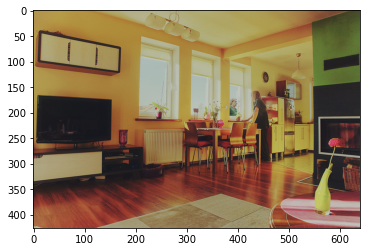

Greedy caption :: living room with couch and television
Beam3 caption :: living room filled with furniture and flat screen tv

------------------------------
Inferrring image 2 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000000285.jpg

Cleaned descriptions:
Orig Desc 1 :: big burly grizzly bear is show with grass in the background
Orig Desc 2 :: the large brown bear has black nose
Orig Desc 3 :: closeup of brown bear sitting in grassy area
Orig Desc 4 :: large bear that is sitting on grass
Orig Desc 5 :: close up picture of brown bear face


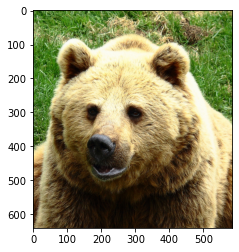

Greedy caption :: brown bear walking across lush green field
Beam3 caption :: brown bear standing on top of grass covered field

------------------------------
Inferrring image 3 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000000632.jpg

Cleaned descriptions:
Orig Desc 1 :: bedroom scene with bookcase blue comforter and window
Orig Desc 2 :: bedroom with bookshelf full of books
Orig Desc 3 :: this room has bed with blue sheets and large bookcase
Orig Desc 4 :: bed and mirror in small room
Orig Desc 5 :: bed room with neatly made bed window and book shelf


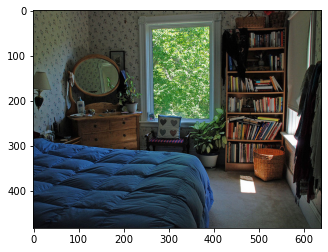

Greedy caption :: living room with couch and table
Beam3 caption :: living room filled with furniture and flat screen tv

------------------------------
Inferrring image 4 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000000724.jpg

Cleaned descriptions:
Orig Desc 1 :: stop sign is mounted upside down on it post
Orig Desc 2 :: stop sign that is hanging upside down
Orig Desc 3 :: an upside down stop sign by the road
Orig Desc 4 :: stop sign put upside down on metal pole
Orig Desc 5 :: stop sign installed upside down on street corner


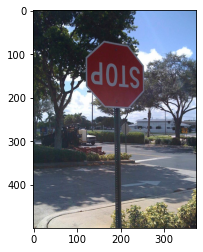

Greedy caption :: stop sign is shown with graffiti on it
Beam3 caption :: red stop sign sitting on the side of the road

------------------------------
Inferrring image 5 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000000776.jpg

Cleaned descriptions:
Orig Desc 1 :: three teddy bears each different color snuggling together
Orig Desc 2 :: three stuffed animals are sitting on bed
Orig Desc 3 :: three teddy bears giving each other hug
Orig Desc 4 :: group of three stuffed animal teddy bears
Orig Desc 5 :: three stuffed bears hugging and sitting on blue pillow


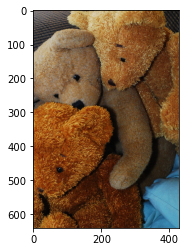

Greedy caption :: two teddy bears sitting on the ground with one of the stuffed bear
Beam3 caption :: brown teddy bear sitting on top of couch

------------------------------
Inferrring image 6 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000000785.jpg

Cleaned descriptions:
Orig Desc 1 :: woman posing for the camera standing on skis
Orig Desc 2 :: woman standing on skiis while posing for the camera
Orig Desc 3 :: woman in red jacket skiing down slope
Orig Desc 4 :: young woman is skiing down the mountain slope
Orig Desc 5 :: person on skis makes her way through the snow


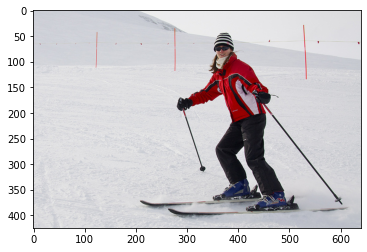

Greedy caption :: man in red jacket skiing down hill
Beam3 caption :: man riding skis on top of snow covered slope

------------------------------
Inferrring image 7 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000000802.jpg

Cleaned descriptions:
Orig Desc 1 :: kitchen with refrigerator stove and oven with cabinets
Orig Desc 2 :: white oven and white refrigerator are in the kitchen
Orig Desc 3 :: the refrigerator is brand new and was delivered today
Orig Desc 4 :: stark white appliances stand out against brown wooden cabinets
Orig Desc 5 :: kitchen appliances and cabinets as seen through opening


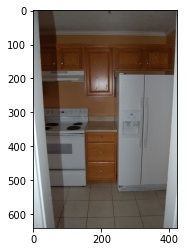

Greedy caption :: kitchen with refrigerator and refrigerator
Beam3 caption :: white refrigerator freezer sitting next to refrigerator

------------------------------
Inferrring image 8 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000000872.jpg

Cleaned descriptions:
Orig Desc 1 :: couple of baseball player standing on field
Orig Desc 2 :: two men playing baseball in field on sunny day
Orig Desc 3 :: two baseball players are playing baseball on field
Orig Desc 4 :: couple of men play baseball and the batter runs for base
Orig Desc 5 :: two guys playing baseball with trees in the back


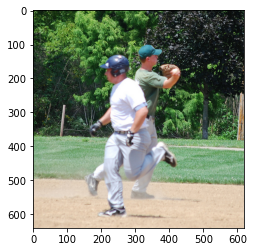

Greedy caption :: man in baseball uniform swinging bat
Beam3 caption :: baseball player holding bat on top of field

------------------------------
Inferrring image 9 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000000885.jpg

Cleaned descriptions:
Orig Desc 1 :: male tennis player in white shorts is playing tennis
Orig Desc 2 :: this woman has just returned volley in tennis
Orig Desc 3 :: man holding tennis racket playing tennis
Orig Desc 4 :: the man balances on one leg after serving tennis ball
Orig Desc 5 :: someone playing in tennis tournament with crowd looking on


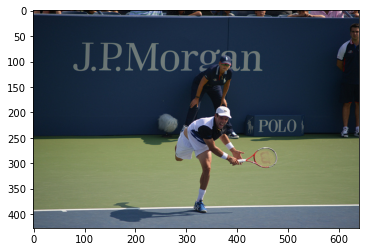

Greedy caption :: woman in white shirt playing tennis
Beam3 caption :: woman holding tennis racquet on top of tennis court

------------------------------
Inferrring image 10 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000001000.jpg

Cleaned descriptions:
Orig Desc 1 :: the people are posing for group photo
Orig Desc 2 :: large family poses for picture on tennis court
Orig Desc 3 :: group of young children standing next to each other
Orig Desc 4 :: group of people that are standing near tennis net
Orig Desc 5 :: group of kids posing for picture on tennis court


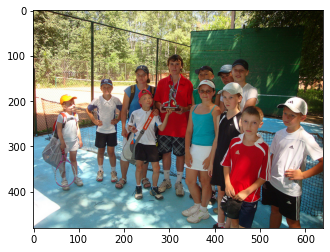

Greedy caption :: group of people standing around tennis court
Beam3 caption :: group of young men playing game of tennis

------------------------------
Inferrring image 11 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000001268.jpg

Cleaned descriptions:
Orig Desc 1 :: beautiful woman taking picture with her smart phone
Orig Desc 2 :: people underneath an arched bridge near the water
Orig Desc 3 :: girl is taking picture of people fishing
Orig Desc 4 :: the woman is taking photo of the white goose next to the river
Orig Desc 5 :: waterway under bridge with people sitting down and woman taking photo


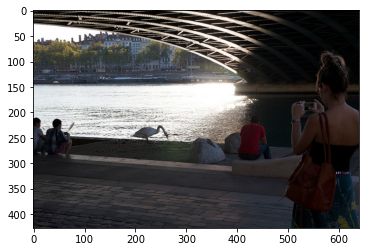

Greedy caption :: woman is walking down the street with an umbrella
Beam3 caption :: woman is walking down the street with an umbrella

------------------------------
Inferrring image 12 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000001296.jpg

Cleaned descriptions:
Orig Desc 1 :: woman holding hello kitty phone on her hands
Orig Desc 2 :: woman holds up her phone in front of her face
Orig Desc 3 :: woman in white shirt holding up cellphone
Orig Desc 4 :: woman checking her cell phone with hello kitty case
Orig Desc 5 :: the asian girl is holding her miss kitty phone


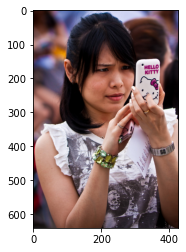

Greedy caption :: woman holding up her phone while sitting on bench
Beam3 caption :: woman holding up her cell phone while sitting on bench

------------------------------
Inferrring image 13 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000001353.jpg

Cleaned descriptions:
Orig Desc 1 :: some children are riding on mini orange train
Orig Desc 2 :: several children are riding on toy train ride
Orig Desc 3 :: the children are riding on an indoor train
Orig Desc 4 :: several children on small indoor kiddie train
Orig Desc 5 :: group of children ride on an indoor train


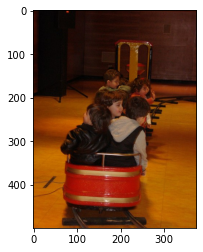

Greedy caption :: group of people sitting around table with luggage
Beam3 caption :: group of people standing around table with cake on it

------------------------------
Inferrring image 14 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000001425.jpg

Cleaned descriptions:
Orig Desc 1 :: meal is lying on plate on table
Orig Desc 2 :: part of sandwich sitting on table
Orig Desc 3 :: plate with burger that is halfway eaten
Orig Desc 4 :: half eaten meal sitting on plate
Orig Desc 5 :: sandwich with bite taken on plate


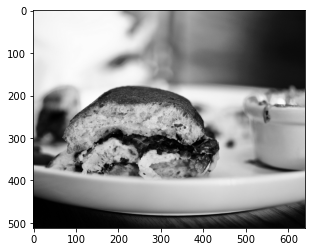

Greedy caption :: plate with sandwich and cup of coffee
Beam3 caption :: white plate topped with piece of cake

------------------------------
Inferrring image 15 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000001490.jpg

Cleaned descriptions:
Orig Desc 1 :: man in wet suit stands on surfboard and rows with paddle
Orig Desc 2 :: paddle boarder on large still body of water
Orig Desc 3 :: man is holding long racquet on surfboard in the middle of the sea
Orig Desc 4 :: black and white of person wearing wetsuit standing on surfboard and holding out paddle in large body of water outside
Orig Desc 5 :: man with wet suit on standing on surfboard in the water


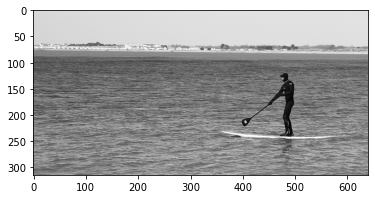

Greedy caption :: man on surfboard in the water
Beam3 caption :: man on surf board in the water

------------------------------
Inferrring image 16 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000001503.jpg

Cleaned descriptions:
Orig Desc 1 :: computer on desk next to laptop
Orig Desc 2 :: picture of an imac desktop next to mac laptop on desk
Orig Desc 3 :: two apple computers are on white desk
Orig Desc 4 :: laptop and desktop computer on white desk
Orig Desc 5 :: computer desk with several pieces of computer equipment


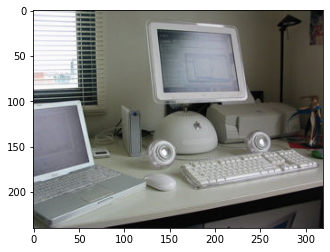

Greedy caption :: computer desk with computer monitor and keyboard
Beam3 caption :: desk with computer monitor and keyboard

------------------------------
Inferrring image 17 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000001532.jpg

Cleaned descriptions:
Orig Desc 1 :: street scene with focus on the street signs on an overpass
Orig Desc 2 :: many cars traveling on busy road with exit signs overhead
Orig Desc 3 :: california traffic goes by road signs on an overpass indicating famous hollywood streets
Orig Desc 4 :: some cars on the freeway are exiting onto sunset blvd
Orig Desc 5 :: cars and trucks driving under the underpass with street signs directing them where to go


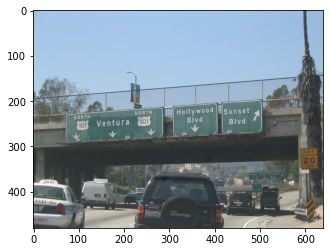

Greedy caption :: street sign with an arrow on it
Beam3 caption :: street corner with many cars and buildings

------------------------------
Inferrring image 18 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000001584.jpg

Cleaned descriptions:
Orig Desc 1 :: the red double decker bus is driving past other buses
Orig Desc 2 :: red double decker bus driving down city street
Orig Desc 3 :: red bus is driving on the road
Orig Desc 4 :: double decker bus rolls along the streets
Orig Desc 5 :: red double decker bus that is in the middle of the road


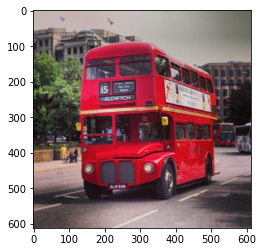

Greedy caption :: red double decker bus driving down street
Beam3 caption :: red double decker bus driving down city street

------------------------------
Inferrring image 19 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000001675.jpg

Cleaned descriptions:
Orig Desc 1 :: cat resting on an open laptop computer
Orig Desc 2 :: black fluffy cat sitting on top of computer keyboard
Orig Desc 3 :: black cat is sitting on metal platform
Orig Desc 4 :: the large cat is resting comfortably behind the laptop screen
Orig Desc 5 :: black and white cat relaxing inside laptop


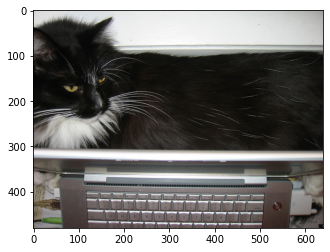

Greedy caption :: cat is sitting on the keyboard of laptop
Beam3 caption :: black and white photo of cat sitting on laptop

------------------------------
Inferrring image 20 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000001761.jpg

Cleaned descriptions:
Orig Desc 1 :: two planes flying in the sky over bridge
Orig Desc 2 :: sky photo to jumbo jet airplanes over bridge
Orig Desc 3 :: two planes fly over bridge in sydney australia with the sydney opera house in the background
Orig Desc 4 :: two jets are flying over bridge and some water
Orig Desc 5 :: two airplanes flying in the sky above black bridge


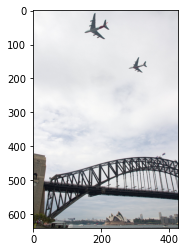

Greedy caption :: large jetliner flying over city with lots of buildings
Beam3 caption :: large jetliner flying over the top of body of water

------------------------------
Inferrring image 21 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000321557.jpg

Cleaned descriptions:
Orig Desc 1 :: close up of motorcycle parked near building
Orig Desc 2 :: motorcycle that is sitting on brick floor
Orig Desc 3 :: large black motorcycle sitting next to white building
Orig Desc 4 :: black motorcycle parked on brick walkway
Orig Desc 5 :: motorcycle parked next to white building


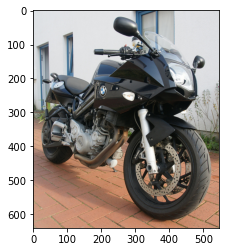

Greedy caption :: motorcycle parked on the side of the road
Beam3 caption :: red motorcycle parked on the side of the road

------------------------------
Inferrring image 22 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000321790.jpg

Cleaned descriptions:
Orig Desc 1 :: young man holds up tennis racket
Orig Desc 2 :: man that is holding tennis racket
Orig Desc 3 :: man in lacoste shirt playing tennis outside
Orig Desc 4 :: tennis player getting ready to play game
Orig Desc 5 :: man holding tennis racket at the tennis courts


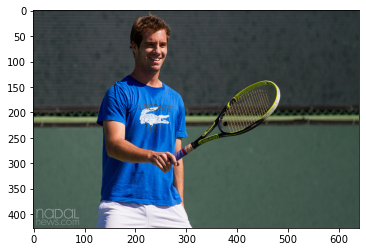

Greedy caption :: man holding tennis racquet on tennis court
Beam3 caption :: man holding tennis racquet on top of tennis court

------------------------------
Inferrring image 23 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000321887.jpg

Cleaned descriptions:
Orig Desc 1 :: white sheep standing in front of colorful wall in building
Orig Desc 2 :: close up of fluffy sheep face
Orig Desc 3 :: sheep stands in front of box of colorful objects
Orig Desc 4 :: shorn sheep looks to the left of the picture
Orig Desc 5 :: white sheep against colored background orange blue purple and yellow


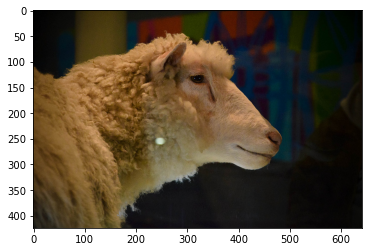

Greedy caption :: two sheep standing in the grass next to each other
Beam3 caption :: two sheep standing in the grass next to tree

------------------------------
Inferrring image 24 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000322163.jpg

Cleaned descriptions:
Orig Desc 1 :: group of three chefs preparing food in kitchen
Orig Desc 2 :: man making pizza in kitchen
Orig Desc 3 :: some people in kitchen preparing food on counter
Orig Desc 4 :: couple of guys cooking in restaruant kitchen that is open to the restaurant
Orig Desc 5 :: cooks are gathered preparing meal in the kitchen


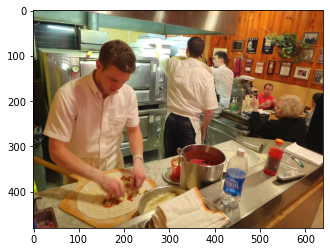

Greedy caption :: man is cutting cake with knife
Beam3 caption :: man and woman preparing food in kitchen

------------------------------
Inferrring image 25 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000322211.jpg

Cleaned descriptions:
Orig Desc 1 :: box full of matching ridged donuts with glaze
Orig Desc 2 :: box of doughnuts just short of dozen
Orig Desc 3 :: box that has doughnuts inside of it
Orig Desc 4 :: an open box of doughnuts on table
Orig Desc 5 :: box of pastries is sitting on table


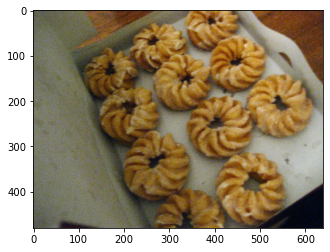

Greedy caption :: box of donuts on table
Beam3 caption :: box of donuts on top of wooden table

------------------------------
Inferrring image 26 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000322352.jpg

Cleaned descriptions:
Orig Desc 1 :: dining room with some plants are seen
Orig Desc 2 :: dinner table with four chairs two potted plants fireplace
Orig Desc 3 :: room with plants on little tables by the windows
Orig Desc 4 :: wooden table with four wooden chairs in front of two windows
Orig Desc 5 :: fireplace and dining table in dining room


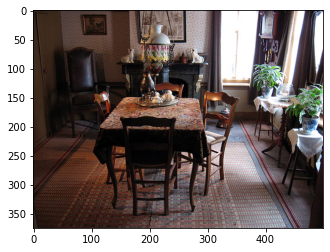

Greedy caption :: living room with table and chairs
Beam3 caption :: living room filled with lots of furniture and table

------------------------------
Inferrring image 27 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000322429.jpg

Cleaned descriptions:
Orig Desc 1 :: wooden shelf filled with lots of glass pots and plates
Orig Desc 2 :: cabinet with vases pots bowls cups and other china
Orig Desc 3 :: cabinet with several different items that have price tags on them
Orig Desc 4 :: shelf of antique pottery in an antique store
Orig Desc 5 :: shelf that has bunch of glass items on it


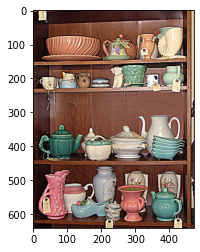

Greedy caption :: kitchen with white china wood and white china hutch
Beam3 caption :: shelf filled with lots of dishes on top of it

------------------------------
Inferrring image 28 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000322574.jpg

Cleaned descriptions:
Orig Desc 1 :: sandwich sitting on top of pile of fries
Orig Desc 2 :: food items served in small tray displayed on table
Orig Desc 3 :: hot dog sitting on top of mound of french fries
Orig Desc 4 :: bread in paper bag on top of french fries in paper container with drink on the side
Orig Desc 5 :: french fries and bag with bread sticking out


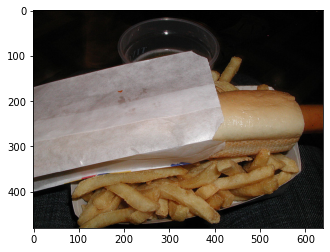

Greedy caption :: sandwich with lettuce and ketchup on plate
Beam3 caption :: close up of plate of food on table

------------------------------
Inferrring image 29 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000322610.jpg

Cleaned descriptions:
Orig Desc 1 :: woman walking past shop filled with merchandise
Orig Desc 2 :: woman leaning against store front with an umbrella
Orig Desc 3 :: the woman with the umbrella is looking at the passerbys
Orig Desc 4 :: people browse the shops while walking on busy street
Orig Desc 5 :: woman holding an umbrella stands as people walk past


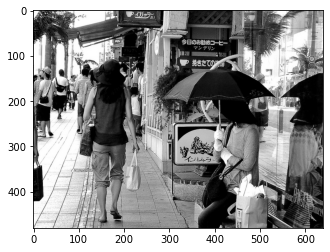

Greedy caption :: woman walking down street with an umbrella
Beam3 caption :: woman walking down street holding an umbrella

------------------------------
Inferrring image 30 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000322724.jpg

Cleaned descriptions:
Orig Desc 1 :: man that is skiing down snowy field
Orig Desc 2 :: woman leaning on ski spikes on snowy mountain
Orig Desc 3 :: man in neon snowsuit is standing on skis
Orig Desc 4 :: person posing for picture on mountain
Orig Desc 5 :: man is standing on snowy hills with his skiis


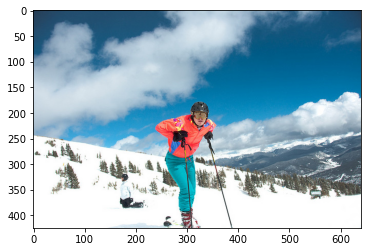

Greedy caption :: man in red jacket skiing down hill
Beam3 caption :: man riding skis on top of snow covered slope

------------------------------
Inferrring image 31 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000322829.jpg

Cleaned descriptions:
Orig Desc 1 :: white meta bench next to patch of grass
Orig Desc 2 :: an ornate fern garden bench outside in the garden
Orig Desc 3 :: white bench with an elegant design of leaves on the back
Orig Desc 4 :: white bench just in front of green bush
Orig Desc 5 :: bench is seated on the grass


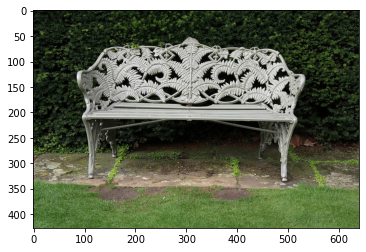

Greedy caption :: bench sitting in the middle of park
Beam3 caption :: wooden bench sitting in the middle of forest

------------------------------
Inferrring image 32 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000322844.jpg

Cleaned descriptions:
Orig Desc 1 :: there are two stuffed animals on wooden bench
Orig Desc 2 :: teddy bear sitting with finding nemo stuffed animal on bench
Orig Desc 3 :: stuffed teddy bear and memo sitting on bunch
Orig Desc 4 :: teddy bear is next to goldfish toy
Orig Desc 5 :: teddy bear and stuffed fish set next to each other


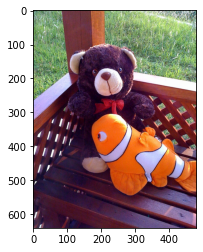

Greedy caption :: teddy bear sitting on bench in the grass
Beam3 caption :: teddy bear sitting on top of wooden bench

------------------------------
Inferrring image 33 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000322864.jpg

Cleaned descriptions:
Orig Desc 1 :: yellow taxi cab sitting below tall buildings
Orig Desc 2 :: picture of an animal is on pole and next to it is yellow taxi
Orig Desc 3 :: couple of yellow signs are near taxi
Orig Desc 4 :: on city road there is lots of taxis
Orig Desc 5 :: two guiding signs are pictured in front of busy street


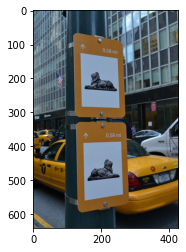

Greedy caption :: man is walking down the street with his bike
Beam3 caption :: two people are walking down the street in the rain

------------------------------
Inferrring image 34 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000322895.jpg

Cleaned descriptions:
Orig Desc 1 :: living room that has bunch of different couches
Orig Desc 2 :: living room filled with furniture next to window
Orig Desc 3 :: living room with white walls rectangular windows and grey and red furniture
Orig Desc 4 :: room with couch chairs television and table
Orig Desc 5 :: room with full wall of windows with multiple sofas and chairs


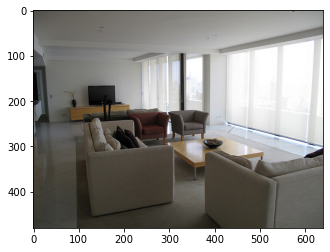

Greedy caption :: living room with couch and television
Beam3 caption :: living room filled with furniture and flat screen tv

------------------------------
Inferrring image 35 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000322944.jpg

Cleaned descriptions:
Orig Desc 1 :: woman with badly bruised face holding stuffed animal
Orig Desc 2 :: an injured woman holding teddy bear close to her chest
Orig Desc 3 :: beat up girl holding teddy bear
Orig Desc 4 :: woman is hugging stuffed mouse close to herself
Orig Desc 5 :: young woman with bruised face and bloody now holding stuffed animal mouse in her arms


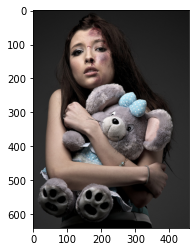

Greedy caption :: woman holding teddy bear with two stuffed animals
Beam3 caption :: woman holding teddy bear in her hand

------------------------------
Inferrring image 36 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000322959.jpg

Cleaned descriptions:
Orig Desc 1 :: bread and fruit are on table with knife and fork
Orig Desc 2 :: some bread ham fruit jam and glass of orange juice
Orig Desc 3 :: an assortment of meats and cheeses with bread
Orig Desc 4 :: variety of different types of food on table
Orig Desc 5 :: selection of breads meat spreads and cheeses


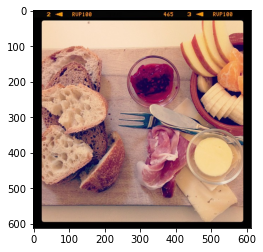

Greedy caption :: plate of food with some fruit and vegetables
Beam3 caption :: table topped with plates of food and drink

------------------------------
Inferrring image 37 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000322968.jpg

Cleaned descriptions:
Orig Desc 1 :: clock is situated atop colorful tower
Orig Desc 2 :: tall green clock tower sitting in the middle of sidewalk
Orig Desc 3 :: colourful building has clock at the top
Orig Desc 4 :: tall green and yellow building with clock at the top
Orig Desc 5 :: large green building with clock at the top of it


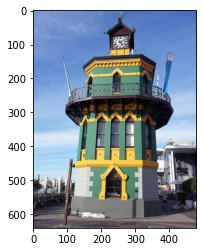

Greedy caption :: red and white clock tower with clock on it
Beam3 caption :: red fire hydrant on the side of the road

------------------------------
Inferrring image 38 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000323151.jpg

Cleaned descriptions:
Orig Desc 1 :: pizza sitting on top of white plate next to glass of beer
Orig Desc 2 :: whole pizza on white plate on table
Orig Desc 3 :: marble table with white plate holding pizza
Orig Desc 4 :: table is set with pizza and beer and salad
Orig Desc 5 :: beer sits untouched on table with other food


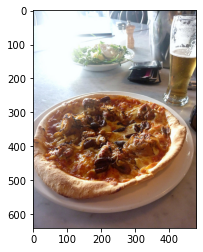

Greedy caption :: pizza with cheese and cheese on top of it
Beam3 caption :: pizza sitting on top of wooden cutting board

------------------------------
Inferrring image 39 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000153669.jpg

Cleaned descriptions:
Orig Desc 1 :: batter after he has hit pitched ball before he is going to run
Orig Desc 2 :: player in action up to bat in baseball game
Orig Desc 3 :: man taking swing of bat at baseball game
Orig Desc 4 :: man swinging bat on top of baseball field
Orig Desc 5 :: baseball player hitting ball at game


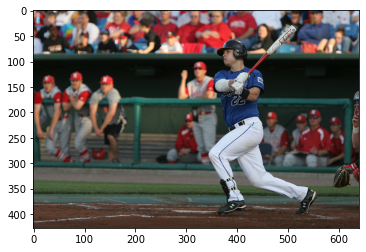

Greedy caption :: baseball player swinging bat at ball
Beam3 caption :: baseball player holding bat on top of field

------------------------------
Inferrring image 40 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000153782.jpg

Cleaned descriptions:
Orig Desc 1 :: the building has light pole with for lights in front of it
Orig Desc 2 :: the big ben clock tower in red and blue shade of color
Orig Desc 3 :: large clock on top of large building
Orig Desc 4 :: blurred picture of clock tower and lamp post
Orig Desc 5 :: large clock standing among building with lamp in the from of the picture


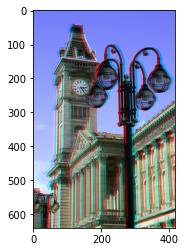

Greedy caption :: clock tower with clock on the side of it
Beam3 caption :: tall building with clock on the side of it

------------------------------
Inferrring image 41 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000153797.jpg

Cleaned descriptions:
Orig Desc 1 :: baseball player throwing pitch onto the field
Orig Desc 2 :: baseball pitcher follows through after releasing the ball
Orig Desc 3 :: pitcher for the camden baseball team throws pitch
Orig Desc 4 :: pitcher at baseball game who has just thrown the ball
Orig Desc 5 :: baseball pitcher is throwing the ball


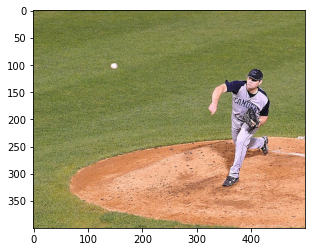

Greedy caption :: baseball player swinging bat on field
Beam3 caption :: baseball player swinging bat on top of field

------------------------------
Inferrring image 42 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000154000.jpg

Cleaned descriptions:
Orig Desc 1 :: small white tow truck parked to another small white tow truck
Orig Desc 2 :: dump truck with dumpster on the back
Orig Desc 3 :: big truck loaded with some items in the back
Orig Desc 4 :: two large trucks are parked near each other
Orig Desc 5 :: white and blue truck parked in the middle of dirt road


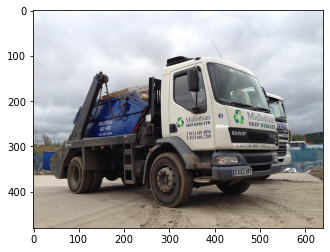

Greedy caption :: truck is parked on the side of the road
Beam3 caption :: an old truck is parked on the side of the road

------------------------------
Inferrring image 43 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000154004.jpg

Cleaned descriptions:
Orig Desc 1 :: few people that are standing on beach
Orig Desc 2 :: group of people on beach looking towards the water
Orig Desc 3 :: several people are shown sitting in the sand at the beach
Orig Desc 4 :: aer of people sitting down on beach near water
Orig Desc 5 :: people are sitting on the sand at the beach


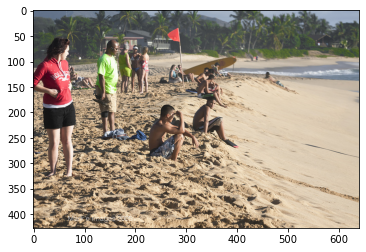

Greedy caption :: group of people standing on top of sandy beach
Beam3 caption :: group of people standing on top of sandy beach

------------------------------
Inferrring image 44 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000154087.jpg

Cleaned descriptions:
Orig Desc 1 :: group of people standing on snow covered hill
Orig Desc 2 :: canadian flags flying along fence where people are standing in snow
Orig Desc 3 :: people are standing on top of snowy hill
Orig Desc 4 :: people stand near some canadian flags at the base of mountain
Orig Desc 5 :: people standing near fence in the snow with canadian flags flying


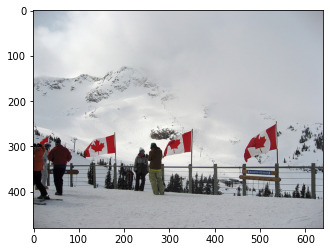

Greedy caption :: group of people standing on top of snow covered slope
Beam3 caption :: group of people riding skis on top of snow covered slope

------------------------------
Inferrring image 45 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000154213.jpg

Cleaned descriptions:
Orig Desc 1 :: scissors are next to pie crust in dish
Orig Desc 2 :: pie sitting in pan on top of table next to pair of scissors
Orig Desc 3 :: tin with pie crust in the bottom
Orig Desc 4 :: there is pie crust inside of pie ring
Orig Desc 5 :: pie crust inside spring form pan on wooden counter


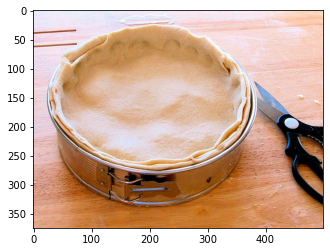

Greedy caption :: the man is holding his hand up to his face
Beam3 caption :: person holding an umbrella in front of stove

------------------------------
Inferrring image 46 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000154339.jpg

Cleaned descriptions:
Orig Desc 1 :: gauges attached to pipes displayed in dimly lit area
Orig Desc 2 :: blurry image of gauge on pipe
Orig Desc 3 :: couple of round gauges in very dark place
Orig Desc 4 :: close shot of some type of machine maybe in factory
Orig Desc 5 :: two red pressure type valves with pipes nearby


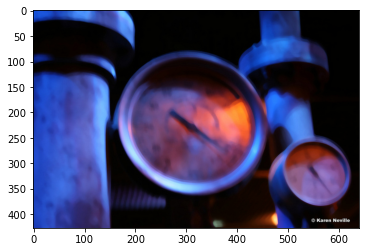

Greedy caption :: clock is on the side of building
Beam3 caption :: clock that is on top of building

------------------------------
Inferrring image 47 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000154358.jpg

Cleaned descriptions:
Orig Desc 1 :: person setting in chair in living room with fireplace and windows
Orig Desc 2 :: living room with girl sitting in chair
Orig Desc 3 :: view of living room that appears to be very elegant
Orig Desc 4 :: woman sits in one of the easy chairs in the big living room
Orig Desc 5 :: living room filled with furniture and table


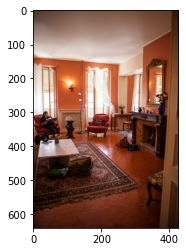

Greedy caption :: living room with couch and table
Beam3 caption :: living room filled with furniture and flat screen tv

------------------------------
Inferrring image 48 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000154425.jpg

Cleaned descriptions:
Orig Desc 1 :: small boy trying to fly small kite
Orig Desc 2 :: young boy flying colorful kite on top of sidewalk
Orig Desc 3 :: young boy gets ready to fly kite
Orig Desc 4 :: boy with kite is standing on sidewalk
Orig Desc 5 :: boy holding kite while standing on sidewalk


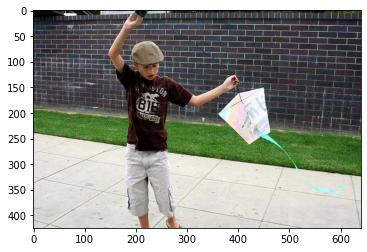

Greedy caption :: man holding an umbrella in his hand
Beam3 caption :: man holding an umbrella in front of building

------------------------------
Inferrring image 49 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000154431.jpg

Cleaned descriptions:
Orig Desc 1 :: view of tv and statue laying on the ground next to window
Orig Desc 2 :: statue of bodt stting on cart with wheels
Orig Desc 3 :: there is statue of body in the room
Orig Desc 4 :: black sculpture of torso is on the floor next to tv
Orig Desc 5 :: living room with tv and entertainment center beside sculpture of torso


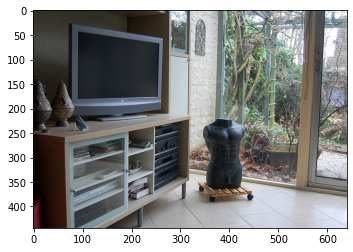

Greedy caption :: living room with tv and tv
Beam3 caption :: living room filled with furniture and flat screen tv

------------------------------
Inferrring image 50 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000154644.jpg

Cleaned descriptions:
Orig Desc 1 :: woman listening on her phone while smoking cigarette
Orig Desc 2 :: person that smoking and on the phone
Orig Desc 3 :: woman smoking while talking on cell phone
Orig Desc 4 :: lady talking on the phone and smoking cigarette
Orig Desc 5 :: woman is talking on her phone while dragging on cigarette


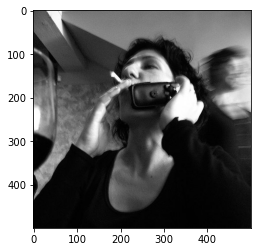

Greedy caption :: man in black shirt holding cell phone
Beam3 caption :: man in suit is talking on cell phone

------------------------------
Inferrring image 51 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000154705.jpg

Cleaned descriptions:
Orig Desc 1 :: few different computers are placed on the desk
Orig Desc 2 :: couple of computers that are sitting on desk
Orig Desc 3 :: small office with laptop computer and printer
Orig Desc 4 :: large computer set up with desktop computer laptop and printer
Orig Desc 5 :: computer sitting on top of white table with another computer


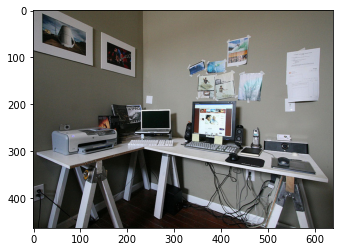

Greedy caption :: desk with laptop computer and other electronics
Beam3 caption :: laptop computer sitting on top of wooden desk

------------------------------
Inferrring image 52 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000154718.jpg

Cleaned descriptions:
Orig Desc 1 :: person is standing over dirty toilet in bathroom stall
Orig Desc 2 :: man is looking into disgusting toilet
Orig Desc 3 :: white toilet filled with crap with two pink roles of toilet paper
Orig Desc 4 :: someone is standing over dirty toilet
Orig Desc 5 :: there is an image of dirty toiet


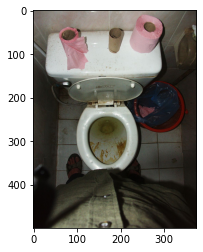

Greedy caption :: toilet with the lid up in the bathroom
Beam3 caption :: white toilet sitting next to white toilet

------------------------------
Inferrring image 53 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000154947.jpg

Cleaned descriptions:
Orig Desc 1 :: sheep standing in dry grass field
Orig Desc 2 :: sheep stands idly at the edge of field
Orig Desc 3 :: single sheep in field looking back at camera
Orig Desc 4 :: sheep is standing in front some grass
Orig Desc 5 :: one sheep is standing in some tall grass


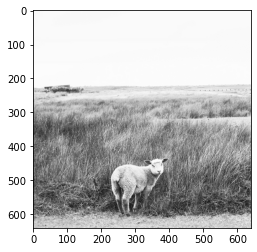

Greedy caption :: sheep grazing on grass covered field
Beam3 caption :: black and white photo of two sheep in field

------------------------------
Inferrring image 54 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000155051.jpg

Cleaned descriptions:
Orig Desc 1 :: close of up clock that makes the moon look small next to it
Orig Desc 2 :: clock tower at night time lit up near view of the moon
Orig Desc 3 :: night sky with view of the moon and large roman numeral clock
Orig Desc 4 :: the night sky with the moon and clock face
Orig Desc 5 :: large clock face at night with the moon in the background


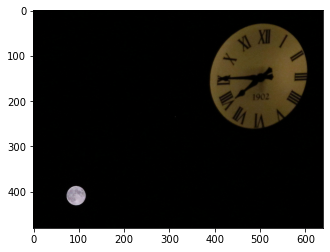

Greedy caption :: clock is on the side of building
Beam3 caption :: clock that is on top of building

------------------------------
Inferrring image 55 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000155145.jpg

Cleaned descriptions:
Orig Desc 1 :: boat with rainbow umbrella sitting in water
Orig Desc 2 :: three people preparing to launch small boat in river
Orig Desc 3 :: three people one in the water with two boats one with an umbrella
Orig Desc 4 :: two boats beside each other with people holding on to the boats
Orig Desc 5 :: blue boat is sitting in the water


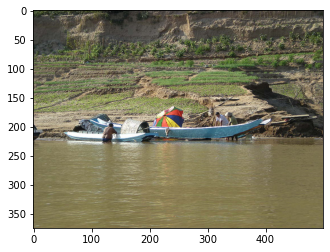

Greedy caption :: man in boat on lake with dog
Beam3 caption :: group of people riding surf boards on river

------------------------------
Inferrring image 56 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000155154.jpg

Cleaned descriptions:
Orig Desc 1 :: the bathroom is small and white and gray
Orig Desc 2 :: small white chamber contains various devices and doors
Orig Desc 3 :: bathroom with significant modifications made to it
Orig Desc 4 :: small bathroom on an airplane with handles on either side
Orig Desc 5 :: some sort of bathroom facility possibly in an airplane


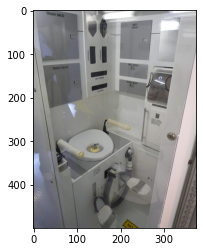

Greedy caption :: bathroom with sink toilet and mirror
Beam3 caption :: bathroom with toilet sink and toilet

------------------------------
Inferrring image 57 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000424776.jpg

Cleaned descriptions:
Orig Desc 1 :: grey colored jet plane flying over snowy mountain range
Orig Desc 2 :: silver jet is flying high in the sky above the clouds
Orig Desc 3 :: jet fighter flying through the sky above snow covered mountain
Orig Desc 4 :: an airplane with the swiss flag symbol is flying through the mountains
Orig Desc 5 :: an airplane flying solo above blue terrain


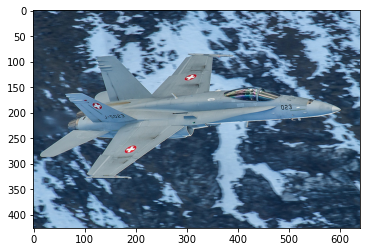

Greedy caption :: fighter jet flying through the air with smoke coming out of it
Beam3 caption :: fighter jet is flying through the sky

------------------------------
Inferrring image 58 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000424975.jpg

Cleaned descriptions:
Orig Desc 1 :: store covered in graffiti on street corner
Orig Desc 2 :: graffiti covered building with woman walking past it
Orig Desc 3 :: building with so many arts on it
Orig Desc 4 :: store on the corner of the street is covered graffiti
Orig Desc 5 :: building that has graffiti on it on the side and the front


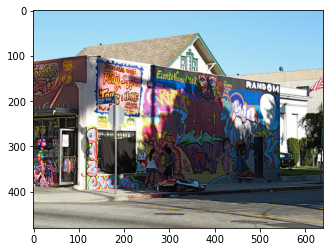

Greedy caption :: man is walking down the street with his luggage
Beam3 caption :: group of people standing in front of building

------------------------------
Inferrring image 59 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000425221.jpg

Cleaned descriptions:
Orig Desc 1 :: plane is flying away from the airport
Orig Desc 2 :: person at an airport terminal with planed in view outside of the windows
Orig Desc 3 :: large terminal in quiet airport hall
Orig Desc 4 :: man waits in an airport terminal as planes take off
Orig Desc 5 :: people in an air port waiting area


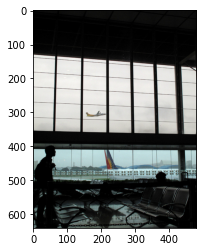

Greedy caption :: clock tower in the middle of the street
Beam3 caption :: clock tower in the middle of city

------------------------------
Inferrring image 60 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000425226.jpg

Cleaned descriptions:
Orig Desc 1 :: man kneeling down in front of refrigerator
Orig Desc 2 :: person kneels down to peer into refrigerator
Orig Desc 3 :: man is searching for food in refrigerator
Orig Desc 4 :: chef is opening and looking into the fridge
Orig Desc 5 :: man wearing an apron peering into the bottom of an open fridge


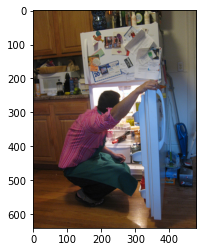

Greedy caption :: young boy is playing with his wii remote
Beam3 caption :: little girl standing in front of refrigerator freezer

------------------------------
Inferrring image 61 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000425227.jpg

Cleaned descriptions:
Orig Desc 1 :: there is no image to describe for this question
Orig Desc 2 :: being is doing something as of right now that is splendid
Orig Desc 3 :: people on beach fly kite near the water
Orig Desc 4 :: couple is on the beach on the waters edge flying kite
Orig Desc 5 :: couple of people standing on beach flying kite


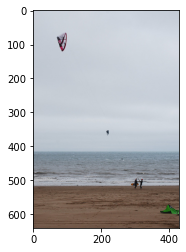

Greedy caption :: people flying kites on beach near the ocean
Beam3 caption :: group of people standing on top of sandy beach next to the ocean

------------------------------
Inferrring image 62 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000425361.jpg

Cleaned descriptions:
Orig Desc 1 :: an individual is capture in the stillness of the picture
Orig Desc 2 :: man sitting at desk with food holding wine glass
Orig Desc 3 :: man who is holding wine glass
Orig Desc 4 :: young man that is having some wine and something to eat
Orig Desc 5 :: man at an office desk drinking glass of wine


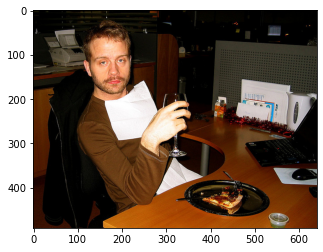

Greedy caption :: man sitting at table with laptop computer
Beam3 caption :: man sitting at table with laptop computer

------------------------------
Inferrring image 63 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000425390.jpg

Cleaned descriptions:
Orig Desc 1 :: large siamese cat sitting on top of laptop computer
Orig Desc 2 :: there is an adult cat sitting on the lap top
Orig Desc 3 :: siamese cat is laying across the laptop keys
Orig Desc 4 :: this cat has no intention of giving up the computer keyboard to human
Orig Desc 5 :: cat resting on laptop keyboard in bedroom


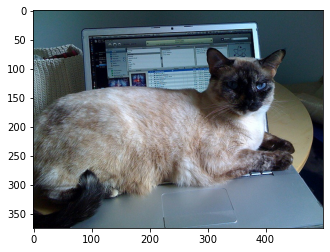

Greedy caption :: cat is sitting on laptop computer
Beam3 caption :: the cat is sitting on the keyboard of laptop

------------------------------
Inferrring image 64 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000425702.jpg

Cleaned descriptions:
Orig Desc 1 :: man holding surfboard walking on beach next to the ocean
Orig Desc 2 :: surfer walking on beach holding surfboard
Orig Desc 3 :: man walking on the beach carrying surfboard
Orig Desc 4 :: lone surfer carries his board next to the shore
Orig Desc 5 :: person walking along the beach with surfboard


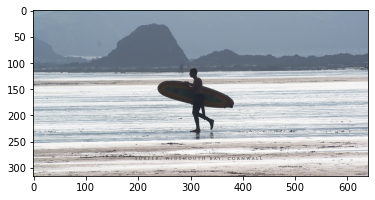

Greedy caption :: man standing on top of beach holding surfboard
Beam3 caption :: man standing on top of sandy beach holding surf board

------------------------------
Inferrring image 65 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000425906.jpg

Cleaned descriptions:
Orig Desc 1 :: man flying through the air while riding snowboard
Orig Desc 2 :: person jumping snow board in the air
Orig Desc 3 :: people look on as an airborne snowboarder competes
Orig Desc 4 :: snow boarder doing flip for the audience
Orig Desc 5 :: person is taken in this very picture


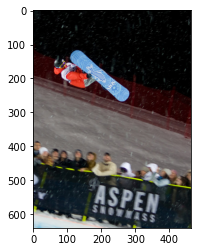

Greedy caption :: man riding skateboard down the side of ramp
Beam3 caption :: man riding skateboard down the side of ramp

------------------------------
Inferrring image 66 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000425925.jpg

Cleaned descriptions:
Orig Desc 1 :: large clock tower in the center of city
Orig Desc 2 :: city street with focal view to building with maroon steeple and clocks under standing platform
Orig Desc 3 :: clock tower sitting in the center of busy city street
Orig Desc 4 :: busy city with building that has clock on it
Orig Desc 5 :: large colorful clock with brown top on tall building near parked cars


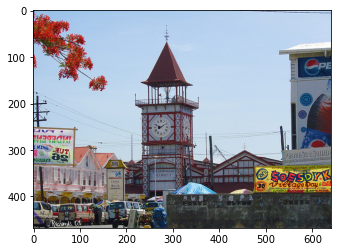

Greedy caption :: large clock tower towering over city street
Beam3 caption :: large clock tower towering over city street

------------------------------
Inferrring image 67 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000426166.jpg

Cleaned descriptions:
Orig Desc 1 :: light blue bicycle chained to pole on the sidewalk in front of red building
Orig Desc 2 :: bicycle near pole in front of building
Orig Desc 3 :: bike is locked to pole in front of red building
Orig Desc 4 :: bicycle is locked to lamp post in front of an old building
Orig Desc 5 :: bicycle that is tied to post along sidewalk


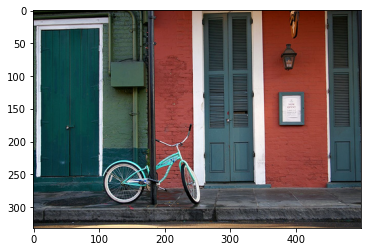

Greedy caption :: bike parked next to building with graffiti on it
Beam3 caption :: bike parked next to building in front of building

------------------------------
Inferrring image 68 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000426203.jpg

Cleaned descriptions:
Orig Desc 1 :: skateboarder is riding along the top of rail
Orig Desc 2 :: parkour while skating on rail in urban
Orig Desc 3 :: skateboarder is grinding on black rail
Orig Desc 4 :: skater is attempting rail grind
Orig Desc 5 :: man riding skateboard down metal hand rail next to some buildings


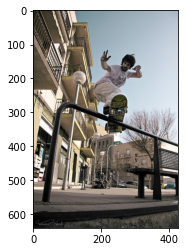

Greedy caption :: man riding skateboard down the side of ramp
Beam3 caption :: man riding skateboard down the side of ramp

------------------------------
Inferrring image 69 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000426241.jpg

Cleaned descriptions:
Orig Desc 1 :: desktop computer sitting on top of glass table
Orig Desc 2 :: home office with chrome and glass desk and computer equipment
Orig Desc 3 :: many electronic devises and tangle of wires are on and around the desk
Orig Desc 4 :: home computer on desk in room
Orig Desc 5 :: computer sitting on see through desk


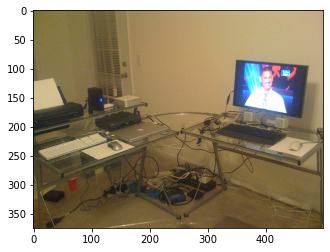

Greedy caption :: computer monitor sitting on top of desk
Beam3 caption :: laptop computer sitting on top of wooden desk

------------------------------
Inferrring image 70 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000426253.jpg

Cleaned descriptions:
Orig Desc 1 :: plate of food being heated in microwave
Orig Desc 2 :: microwave oven with some food inside of it
Orig Desc 3 :: microwave that has some food in it
Orig Desc 4 :: food is cooking in stainless steal microwave
Orig Desc 5 :: food is cooking inside of microwave oven


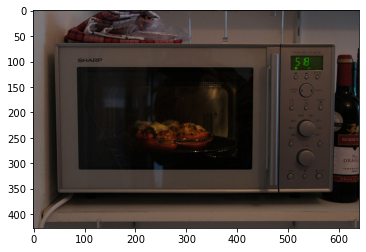

Greedy caption :: microwave oven sitting on top of counter
Beam3 caption :: toaster oven sitting on top of kitchen counter

------------------------------
Inferrring image 71 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000426268.jpg

Cleaned descriptions:
Orig Desc 1 :: large long train with man inside on the track
Orig Desc 2 :: am unable to see an image above
Orig Desc 3 :: train cars sit on track next to roadway
Orig Desc 4 :: black train engine and its driver and red caboose
Orig Desc 5 :: man standing in black train with red train in front


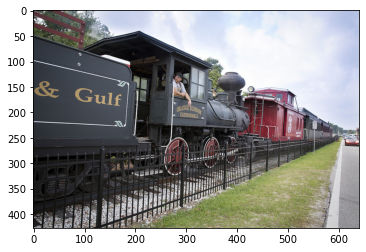

Greedy caption :: train is coming down the tracks near some trees
Beam3 caption :: an old fashioned train engine sitting on the tracks

------------------------------
Inferrring image 72 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000426297.jpg

Cleaned descriptions:
Orig Desc 1 :: the zebra is wondering about the shadow that he sees
Orig Desc 2 :: zebra facing away from the camera and staring down
Orig Desc 3 :: zebra that is standing up in the dirt
Orig Desc 4 :: zebra looking down at grass and dirt filled ground
Orig Desc 5 :: zebra has its neck turned and is looking to its side


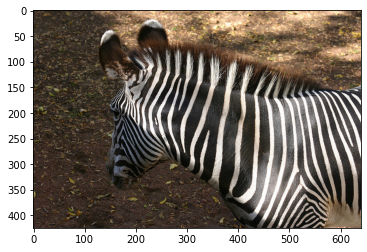

Greedy caption :: zebra standing in the grass next to tree
Beam3 caption :: two zebras standing in the grass next to tree

------------------------------
Inferrring image 73 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000426329.jpg

Cleaned descriptions:
Orig Desc 1 :: some frosted cakes with little decorations on top in display case for sale
Orig Desc 2 :: display window full of lots of cakes
Orig Desc 3 :: rows of cylindrical cakes for sale in bakery seen behind glass
Orig Desc 4 :: dining table with cakes and tv monitor
Orig Desc 5 :: several desserts sitting behind glass window with display cards in front of them


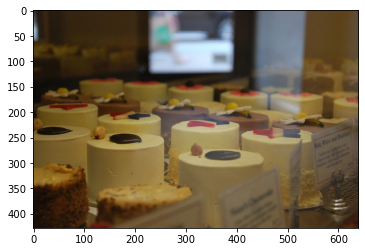

Greedy caption :: toilet with white paper on top of it
Beam3 caption :: white toilet sitting next to white toilet

------------------------------
Inferrring image 74 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000426372.jpg

Cleaned descriptions:
Orig Desc 1 :: white truck with red car sitting in it back
Orig Desc 2 :: white truck with red car on its bed
Orig Desc 3 :: specialized transport truck displays classic car
Orig Desc 4 :: white truck carrying small car in the back
Orig Desc 5 :: truck is shown with another car in the back of it


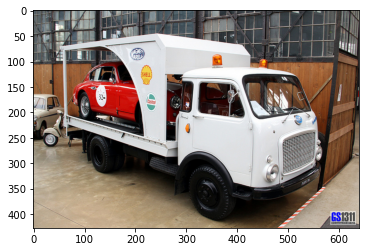

Greedy caption :: truck with graffiti on it is parked in front of building
Beam3 caption :: red truck parked on the side of the road next to building

------------------------------
Inferrring image 75 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000001818.jpg

Cleaned descriptions:
Orig Desc 1 :: zebra in the grass who is cleaning himself
Orig Desc 2 :: baby giraffe drinking milk from it mother in field
Orig Desc 3 :: baby zebra is suckling milk from its mother
Orig Desc 4 :: baby zebra nursing from an adult zebra
Orig Desc 5 :: baby zebra sucking milk from its mothers teat


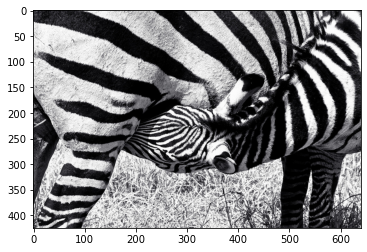

Greedy caption :: two zebras standing in the grass near trees
Beam3 caption :: group of zebra standing next to each other on field

------------------------------
Inferrring image 76 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000004395.jpg

Cleaned descriptions:
Orig Desc 1 :: man in shirt and tie motioning with his hand
Orig Desc 2 :: young man wearing white shirt and tie
Orig Desc 3 :: man in dress shirt and tie looks in front of him
Orig Desc 4 :: man in suit poses for the camera
Orig Desc 5 :: man in suit and tie holding up hand


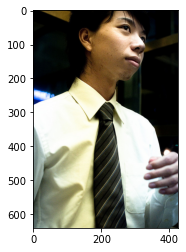

Greedy caption :: man wearing suit and tie
Beam3 caption :: the man is wearing suit and tie

------------------------------
Inferrring image 77 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000006771.jpg

Cleaned descriptions:
Orig Desc 1 :: woman dressed up in costume talking on cell phone
Orig Desc 2 :: woman in costume speaks on cellphone
Orig Desc 3 :: women in costume who is talking on cell phone
Orig Desc 4 :: woman on cell phone with group of people
Orig Desc 5 :: the woman wearing costume among others is using cell phone


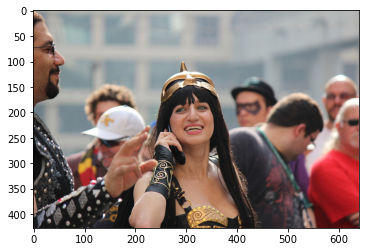

Greedy caption :: group of people standing around each other
Beam3 caption :: group of people standing next to each other

------------------------------
Inferrring image 78 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000008277.jpg

Cleaned descriptions:
Orig Desc 1 :: the meal consists of chopped chicken with cheese and brocolli
Orig Desc 2 :: styrofoam plate with shredded chicken and dish of broccoli with cheese sauce
Orig Desc 3 :: close up of plate of food on carpeted floor
Orig Desc 4 :: plate of shredded chicken with broccoli cheese sauce
Orig Desc 5 :: white plate topped wti chicken and cup of guacamole


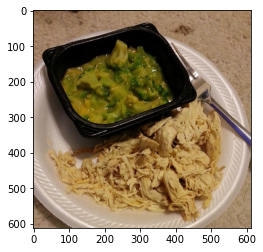

Greedy caption :: bowl of food with broccoli and carrots
Beam3 caption :: close up of plate of food on table

------------------------------
Inferrring image 79 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000010707.jpg

Cleaned descriptions:
Orig Desc 1 :: man standing in living room holding nintendo wii game controller
Orig Desc 2 :: three people with cups on the couch and one with remote standing
Orig Desc 3 :: man holding motion controlled video game controller
Orig Desc 4 :: man with video game controller in living room with onlooker seated nearby
Orig Desc 5 :: man playing video game while two men sit on couch


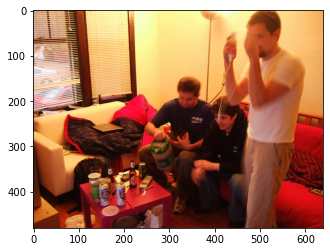

Greedy caption :: two people playing video games in living room
Beam3 caption :: group of people standing around each other in living room

------------------------------
Inferrring image 80 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000013291.jpg

Cleaned descriptions:
Orig Desc 1 :: group of people hold up frisbees for the camera
Orig Desc 2 :: group of people holding frisbees on field
Orig Desc 3 :: group of people in field smile holding frisbees
Orig Desc 4 :: several people posing in field while holding frisbees
Orig Desc 5 :: group of people playing with frisbee on the grass


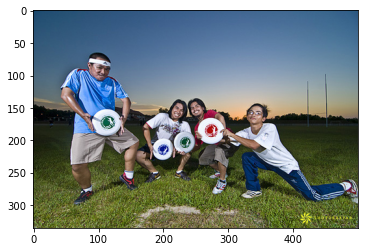

Greedy caption :: man in black shirt and black shorts playing game of frisbee
Beam3 caption :: group of young men playing game of frisbee

------------------------------
Inferrring image 81 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000016228.jpg

Cleaned descriptions:
Orig Desc 1 :: there is white horse pulling trolley behind it
Orig Desc 2 :: horse pulling wagon with conductor down the road
Orig Desc 3 :: large white horse pulling trolley car down the street
Orig Desc 4 :: trolley that is being pulled by white horse
Orig Desc 5 :: horse pulling trolley carriage with man on it


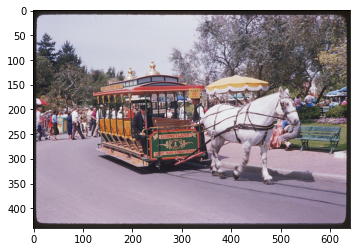

Greedy caption :: horse drawn carriage is parked in front of building
Beam3 caption :: horse drawn carriage on city street

------------------------------
Inferrring image 82 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000018833.jpg

Cleaned descriptions:
Orig Desc 1 :: cat sleeping with its head resting on sneaker
Orig Desc 2 :: cat that is laying with its head upon sneaker
Orig Desc 3 :: cat sleeping on the ground using shoe as pillow
Orig Desc 4 :: cat is laying on white shoe
Orig Desc 5 :: nat naps with his head on sneaker


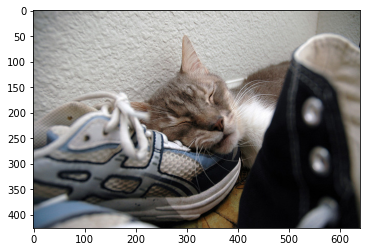

Greedy caption :: cat laying on the floor next to pair of shoes
Beam3 caption :: black and white cat laying on top of pair of shoes

------------------------------
Inferrring image 83 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000022192.jpg

Cleaned descriptions:
Orig Desc 1 :: dog is sitting on an unmade bed with pillows
Orig Desc 2 :: dog sitting in pile of bedding and other stuff
Orig Desc 3 :: dog sits on top of mess of items
Orig Desc 4 :: dog sitting on bed covered with clothing blankets and other items
Orig Desc 5 :: pit bull dog on messy bed


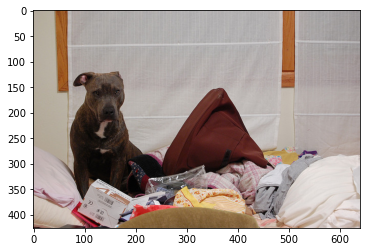

Greedy caption :: dog is laying on the floor next to an open suitcase
Beam3 caption :: dog laying on top of bed next to dog

------------------------------
Inferrring image 84 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000023899.jpg

Cleaned descriptions:
Orig Desc 1 :: three young men playing wii on projection television
Orig Desc 2 :: three men laughing at some pictures from projector
Orig Desc 3 :: group of gentleman playing video games in dimly lit room
Orig Desc 4 :: some people chilling on the couch playing with nintendo wii
Orig Desc 5 :: group of men playing game with remote controllers


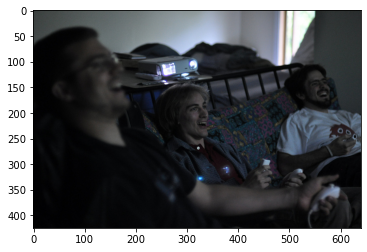

Greedy caption :: man is holding up his cell phone while sitting in chair
Beam3 caption :: two people sitting at table with their cell phones

------------------------------
Inferrring image 85 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000025603.jpg

Cleaned descriptions:
Orig Desc 1 :: girl with some food and drink at table
Orig Desc 2 :: young girl eating pizza dressed as egyption
Orig Desc 3 :: girl sitting around table in restaurant eating pizza
Orig Desc 4 :: young girl eating pizza in restaurant
Orig Desc 5 :: girl in cleopatra outfit eating pizza at table


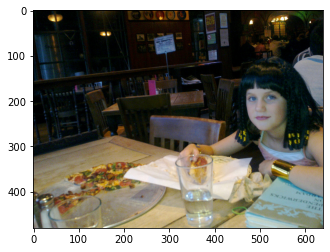

Greedy caption :: woman sitting at table with plate of food
Beam3 caption :: woman sitting at table with plate of food

------------------------------
Inferrring image 86 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000029393.jpg

Cleaned descriptions:
Orig Desc 1 :: large brown dog standing on the side of white wood fence
Orig Desc 2 :: dog standing on bench with an orange tree in back
Orig Desc 3 :: dog standing on ledge in front of lemon tree
Orig Desc 4 :: brown and white dog fence and tree
Orig Desc 5 :: brown dog standing on wooden bench near lemon tree


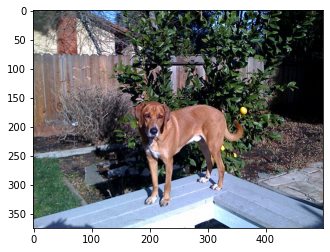

Greedy caption :: dog is standing on the floor next to red fire hydrant
Beam3 caption :: dog is standing in the grass next to red fire hydrant

------------------------------
Inferrring image 87 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000031817.jpg

Cleaned descriptions:
Orig Desc 1 :: man riding motorcycle while eating food
Orig Desc 2 :: man wearing helmet sitting on motor scooter in traffic
Orig Desc 3 :: man leans forward on his motor bike as he sits in traffic
Orig Desc 4 :: person on motor scooter with helmet on
Orig Desc 5 :: man on motor scooter waiting in group of motor scooters


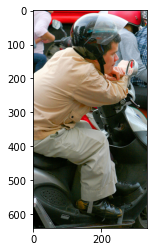

Greedy caption :: man riding motorcycle with dog on it
Beam3 caption :: group of people sitting on top of motorcycle

------------------------------
Inferrring image 88 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000034071.jpg

Cleaned descriptions:
Orig Desc 1 :: the photo of the double parking meter has blurry city in the background
Orig Desc 2 :: two parking meter with the sunshine in the background
Orig Desc 3 :: double telescope for seeing things that are far away
Orig Desc 4 :: close up of what appears to be two traffic machines
Orig Desc 5 :: two parking meters with the light of the sunset reflecting off one


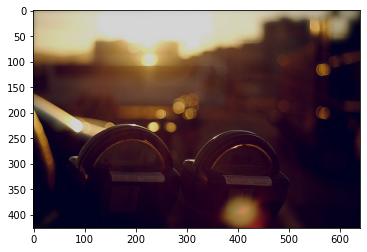

Greedy caption :: parking meter with the word written on it
Beam3 caption :: two parking meters on the side of the street

------------------------------
Inferrring image 89 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000037988.jpg

Cleaned descriptions:
Orig Desc 1 :: woman is throwing tennis ball to serve
Orig Desc 2 :: female tennis player on the court serving ball
Orig Desc 3 :: female tennis player tossing tennis ball up
Orig Desc 4 :: women tennis player throwing the ball up for serve
Orig Desc 5 :: woman tennise player standing at the service line and throwing tennis ball up in the air to serve it


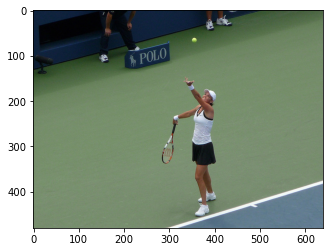

Greedy caption :: man playing tennis on tennis court
Beam3 caption :: tennis player swinging racket at ball

------------------------------
Inferrring image 90 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000041488.jpg

Cleaned descriptions:
Orig Desc 1 :: the road sign says east queens bronx
Orig Desc 2 :: highway road sign directing the way ahead
Orig Desc 3 :: large and green interstate exit sign above road
Orig Desc 4 :: green road sign showing the queens bronx exit
Orig Desc 5 :: an green and white overhead street sign on interstate for queens and bronx showing truck restriction


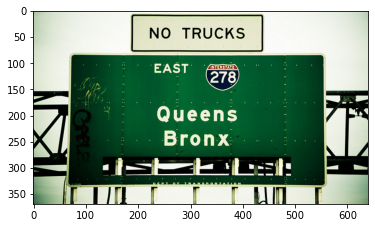

Greedy caption :: street sign with street signs on it
Beam3 caption :: street sign that is on the side of the street

------------------------------
Inferrring image 91 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000043581.jpg

Cleaned descriptions:
Orig Desc 1 :: restaurant table with plate of vegetable pizza and garnishment
Orig Desc 2 :: small ham and pineapple pizza on plate next to spicy pepper shaker
Orig Desc 3 :: small pizza sitting on blue table
Orig Desc 4 :: pizza on plate on table
Orig Desc 5 :: whole freshly made pizza in restaurant


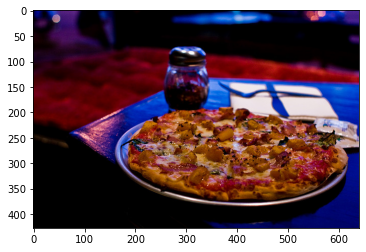

Greedy caption :: pizza with cheese and cheese on top of it
Beam3 caption :: large pizza sitting on top of wooden table

------------------------------
Inferrring image 92 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000045728.jpg

Cleaned descriptions:
Orig Desc 1 :: some delicious noodles are being cooked on pan
Orig Desc 2 :: plate of noodles with sauce and fork
Orig Desc 3 :: plate of cooked noodles fork and knife is displayed
Orig Desc 4 :: plate topped with noodles and fork
Orig Desc 5 :: cake with cream topping on the plate


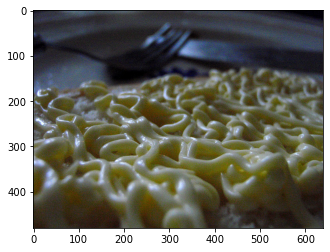

Greedy caption :: pizza with cheese and cheese on top of it
Beam3 caption :: close up of pizza on table

------------------------------
Inferrring image 93 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000048153.jpg

Cleaned descriptions:
Orig Desc 1 :: foot wearing pointy pink flat shoe rested upon bench
Orig Desc 2 :: woman showing off her pink pointy toed heels
Orig Desc 3 :: woman wearing blue jeans with sexy foot in pink shoe
Orig Desc 4 :: photo of bright pink shoe on blue and green background
Orig Desc 5 :: lady wearing pink shoe and blue jeans


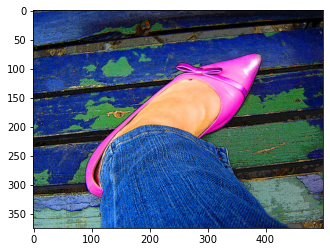

Greedy caption :: young boy is sitting on bench with his skateboard
Beam3 caption :: young boy sitting on bench in front of building

------------------------------
Inferrring image 94 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000050679.jpg

Cleaned descriptions:
Orig Desc 1 :: close up of an orange on the side of the road
Orig Desc 2 :: an orange is on the white line on street and some cars
Orig Desc 3 :: close up of an orange on city street
Orig Desc 4 :: an orange sitting in the middle of road
Orig Desc 5 :: an orange lying near the white stripe of highway


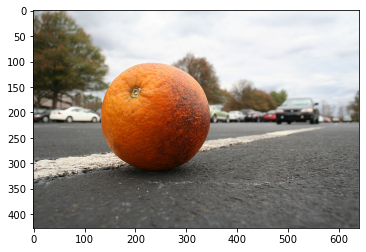

Greedy caption :: an orange and orange apple sitting on top of wooden table
Beam3 caption :: close up of an orange apple on top of table

------------------------------
Inferrring image 95 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000052017.jpg

Cleaned descriptions:
Orig Desc 1 :: yellow and blue plant flying in gray sky
Orig Desc 2 :: small airplane is flying in the sky
Orig Desc 3 :: brightly colored single engine plane is high in the clear sky
Orig Desc 4 :: am unable to see an image above
Orig Desc 5 :: an old yellow plane is flying in the sky


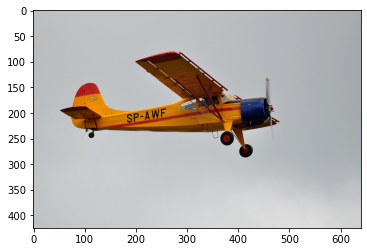

Greedy caption :: an airplane is flying through the sky with its landing gear
Beam3 caption :: an airplane is flying in the sky

------------------------------
Inferrring image 96 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000055950.jpg

Cleaned descriptions:
Orig Desc 1 :: man is playing tennis and is going to return the ball
Orig Desc 2 :: man playing tennis on tennis court
Orig Desc 3 :: man at the net makes forehand volley in tennis match
Orig Desc 4 :: young man playing tennis and preparing to hit the ball
Orig Desc 5 :: man is on court with tennis racket


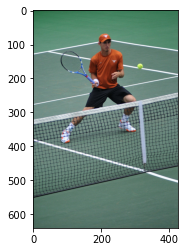

Greedy caption :: man holding tennis racquet on tennis court
Beam3 caption :: man holding tennis racquet on top of tennis court

------------------------------
Inferrring image 97 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000060090.jpg

Cleaned descriptions:
Orig Desc 1 :: yellow commuter train parked at train station
Orig Desc 2 :: yellow train pulling into the train station
Orig Desc 3 :: yellow passenger train pulling up to station
Orig Desc 4 :: yellow train is pulling in to train station
Orig Desc 5 :: the locomotive of train is painted yellow


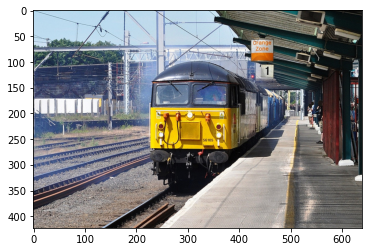

Greedy caption :: train is traveling down the tracks in the city
Beam3 caption :: red and yellow train traveling down train tracks

------------------------------
Inferrring image 98 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000061471.jpg

Cleaned descriptions:
Orig Desc 1 :: puppy chewing on toilet paper in the bathroom
Orig Desc 2 :: brown dog standing next to toilet in bathroom
Orig Desc 3 :: puppy pulls line of toilet paper
Orig Desc 4 :: dog playing with roll of toilet paper in bathroom
Orig Desc 5 :: puppy has pulled toilet paper across the bathroom floor


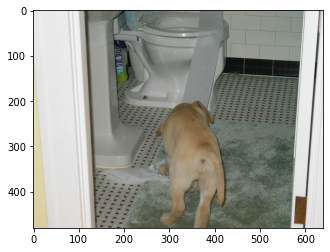

Greedy caption :: cat is sitting on the floor next to toilet
Beam3 caption :: cat is sitting on the floor next to toilet

------------------------------
Inferrring image 99 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000064462.jpg

Cleaned descriptions:
Orig Desc 1 :: skier posing on steep snowy hill
Orig Desc 2 :: female skier stops and poses for picture
Orig Desc 3 :: woman smiles as she stands in skis on snowy hill
Orig Desc 4 :: woman on skis on ski slope posing for picture
Orig Desc 5 :: female skier smiling while standing in the snow


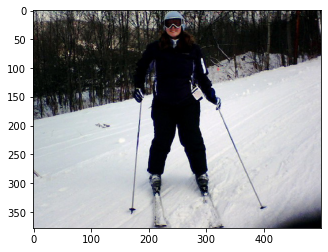

Greedy caption :: man in red jacket skiing down hill
Beam3 caption :: two people on skis in the snow

------------------------------
Inferrring image 100 of 100:
/media/rohit/DATA/EverythingD/01SRH-BDBA Acads/Thesis/StoryGenerator/Data/COCO_val2017_5k/val2017/000000066523.jpg

Cleaned descriptions:
Orig Desc 1 :: bed topped with three white pillows covered in canopy
Orig Desc 2 :: bed with white and beige linens and clear drape
Orig Desc 3 :: made bed with mosquito netting above it
Orig Desc 4 :: bed with white and gray bedding and netting overhead
Orig Desc 5 :: full size bed with mosquito netting above all in neutral colors


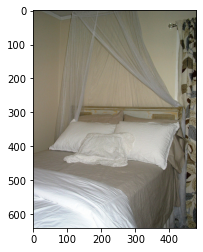

Greedy caption :: bed with white sheets and pillows
Beam3 caption :: bedroom with two beds and window


In [15]:
for idx, inFile in enumerate(files2infer):
    print(f"\n{'-' * 30}\nInferrring image {idx+1} of {num_images_to_infer}:\n{inFile}")
    IMG_TO_INFER = inFile
    print(f"\nCleaned descriptions:")
    for idx, each_desc in enumerate(desc_test.get(os.path.basename(IMG_TO_INFER).rstrip('.jpg'))):
        print(f"Orig Desc {idx+1} :: {each_desc}")
    infer_for_caption_one_image_from_jpg(IMG_TO_INFER, MAX_LENGTH_CAPTION, reloaded_RNN_decoder, _wordtoix = wordtoix, _ixtoword = ixtoword)